In [13]:
import matplotlib.pyplot as plt

import numpy as np

import os

import pandas as pd


In [14]:
file='./OxCGRT_latest.csv'

In [15]:
data = pd.read_csv(file)
cabecera= list(data.columns[1:3])
stringency = cabecera + list(x for x in data.columns if x.startswith('String'))

datatowrite= data[stringency]
#datatowrite.to_csv('stringency.csv')
#datatowrite

In [16]:
data.columns
stringency_sola= list(data.columns[0:3])+list(x for x in data.columns if x.startswith('StringencyIndexForDisplay'))
stringency_sola

['CountryName', 'CountryCode', 'Date', 'StringencyIndexForDisplay']

In [17]:
data=data[stringency_sola]
data

,CountryName,CountryCode,Date,StringencyIndexForDisplay
0,Aruba,ABW,20200101,0.00
1,Aruba,ABW,20200102,0.00
2,Aruba,ABW,20200103,0.00
3,Aruba,ABW,20200104,0.00
4,Aruba,ABW,20200105,0.00
...,...,...,...,...
26064,Kosovo,RKS,20200528,87.04
26065,Kosovo,RKS,20200529,87.04
26066,Kosovo,RKS,20200530,87.04
26067,Kosovo,RKS,20200531,87.04


In [29]:
lista_codigo_pais=[data.loc[0,"CountryCode"]]
nombre_pais=[data.loc[0,"CountryName"]]
lista_datos_pais=[]

fechas=[data.loc[0,"Date"]]
num_paises=1
e=0
lista_peq=[]



In [30]:
print(lista_codigo_pais)

['ABW']


In [19]:
indice_nulo=1
for index, rows in data.iterrows():
    
    if rows.CountryCode != lista_codigo_pais[-1]:
        
        indice_nulo=1
        e=1
        lista_codigo_pais.append(rows.CountryCode)
        num_paises+=1
        lista_datos_pais.append(lista_peq)
        #print(len(lista_peq),rows.CountryCode )
        lista_peq=[rows.StringencyIndexForDisplay]
        #diccionario pais -codigo
        nombre_pais.append(rows.CountryName)
    else:
        if pd.isnull(data.loc[index, 'StringencyIndexForDisplay']):
            valor= data.loc[index-indice_nulo,'StringencyIndexForDisplay']
            indice_nulo+=1
            
            lista_peq.append(valor)
        else:
            lista_peq.append(rows.StringencyIndexForDisplay)
    if e==0:
        fechas.append(rows.Date)
lista_datos_pais.append(lista_peq)

In [400]:
from datetime import datetime
fechas_transformadas= [datetime.strptime(str(x), '%Y%m%d') for x in fechas]


In [381]:

df=pd.DataFrame(lista_datos_pais, index=lista_codigo_pais,columns=fechas_transformadas).T
#algunos paises no estan actualizados desde hace 2 dias, asique tenemos que quitarlo
#df=df.drop([20200531,20200601])
df

,ABW,AFG,AGO,ALB,AND,ARE,ARG,AUS,AUT,AZE,...,USA,UZB,VEN,VNM,YEM,ZAF,ZMB,ZWE,TWN,RKS
2020-01-01,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2020-01-01,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.56,0.00
2020-01-02,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.56,0.00
2020-01-03,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.56,0.00
2020-01-04,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.56,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-28,41.67,78.7,81.48,83.33,50.0,72.22,90.74,62.5,55.56,85.19,...,72.69,86.11,85.19,65.74,50.93,84.26,43.52,87.96,22.22,87.04
2020-05-29,41.67,78.7,81.48,83.33,50.0,72.22,90.74,62.5,55.56,85.19,...,72.69,86.11,85.19,65.74,50.93,84.26,43.52,87.96,22.22,87.04
2020-05-30,41.67,78.7,81.48,83.33,50.0,72.22,90.74,62.5,55.56,85.19,...,72.69,86.11,85.19,65.74,50.93,84.26,43.52,87.96,22.22,87.04
2020-05-31,41.67,NaN,NaN,NaN,NaN,72.22,90.74,62.5,55.56,NaN,...,NaN,NaN,85.19,NaN,NaN,NaN,NaN,NaN,NaN,84.26


In [382]:
#escribir csv pais y codigo
dpc=pd.DataFrame(nombre_pais, index=lista_codigo_pais)
dpc.to_csv('codigo_pais.csv')

In [383]:
#escribir csv stringency por pais y fecha
df.to_csv('stringency_country_date.csv')

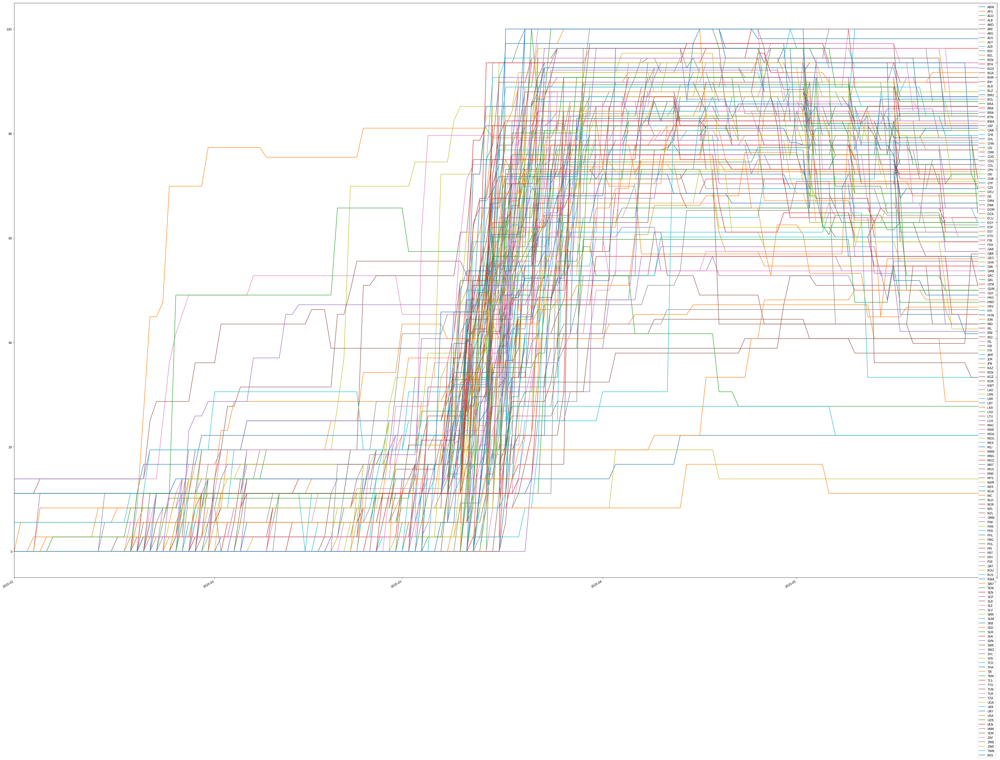

In [478]:
plt.figure()
df.plot(figsize=(60,40))
plt.savefig('string.png')

In [476]:
#esta dataframe hace trampas para hacer la visualizacion de rio
df_rio=pd.DataFrame(lista_datos_pais, index=lista_codigo_pais,columns=fechas_transformadas)
df_rio.drop(df_rio.columns[-1], axis=1, inplace=True)
df_rio.drop(df_rio.columns[-1], axis=1, inplace=True)
df_rio = df_rio.cumsum().T

df_rio


,ABW,AFG,AGO,ALB,AND,ARE,ARG,AUS,AUT,AZE,...,USA,UZB,VEN,VNM,YEM,ZAF,ZMB,ZWE,TWN,RKS
2020-01-01,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,52.78,52.78,52.78,52.78,52.78,52.78,52.78,52.78,52.78,52.78
2020-01-01,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,66.67,66.67,66.67,66.67,66.67,66.67,66.67,66.67,72.23,72.23
2020-01-02,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,72.23,72.23,72.23,72.23,72.23,72.23,72.23,72.23,77.79,77.79
2020-01-03,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,72.23,72.23,72.23,72.23,72.23,72.23,72.23,72.23,77.79,77.79
2020-01-04,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,75.01,75.01,75.01,75.01,75.01,75.01,75.01,75.01,80.57,80.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-26,45.37,124.07,205.55,288.88,338.88,411.1,501.84,564.34,619.9,705.09,...,11385.71,11471.82,11557.01,11622.75,11673.68,11757.94,11801.46,11889.42,11911.64,11998.68
2020-05-27,41.67,120.37,201.85,285.18,335.18,407.4,498.14,560.64,616.2,701.39,...,11382.01,11468.12,11553.31,11619.05,11669.98,11754.24,11797.76,11885.72,11907.94,11994.98
2020-05-28,41.67,120.37,201.85,285.18,335.18,407.4,498.14,560.64,616.2,701.39,...,11375.06,11461.17,11546.36,11612.10,11663.03,11747.29,11790.81,11878.77,11900.99,11988.03
2020-05-29,41.67,120.37,201.85,285.18,335.18,407.4,498.14,560.64,616.2,701.39,...,11341.73,11427.84,11513.03,11578.77,11629.70,11713.96,11757.48,11845.44,11867.66,11954.70


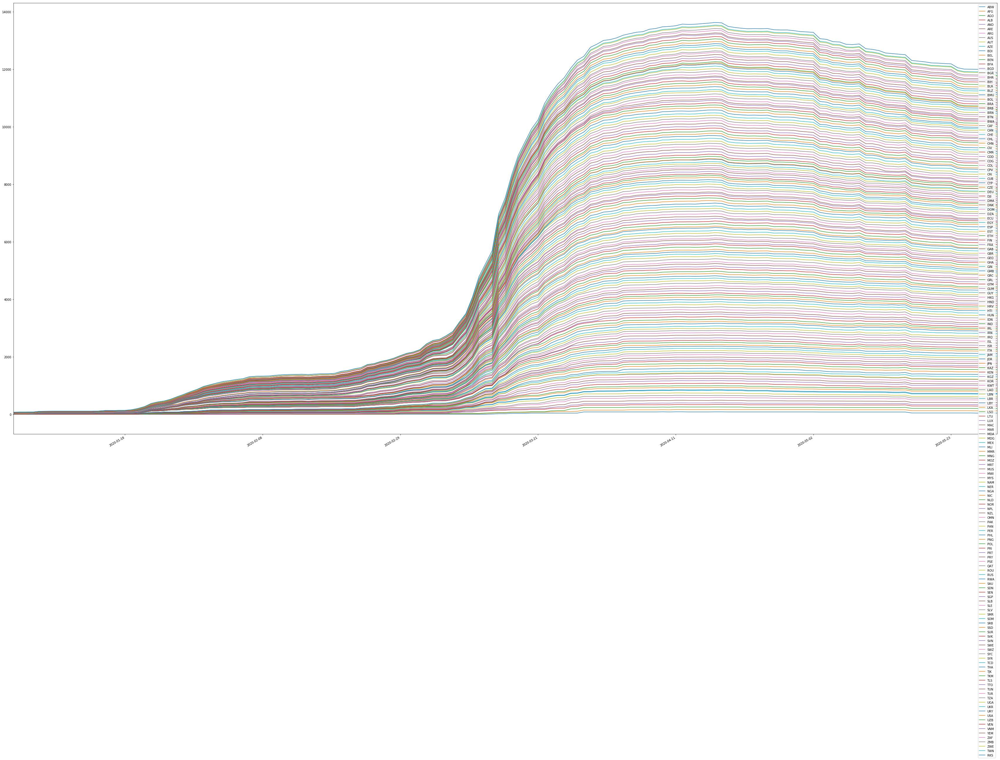

In [477]:
plt.figure()
df_rio.plot(figsize=(60,30))
plt.savefig('rio.png')

In [472]:
df_rio_centrada=df_rio
df_rio_centrada

,ABW,AFG,AGO,ALB,AND,ARE,ARG,AUS,AUT,AZE,...,USA,UZB,VEN,VNM,YEM,ZAF,ZMB,ZWE,TWN,RKS
2020-01-01,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,...,3.470,3.470,3.470,3.470,3.470,3.470,3.470,3.470,3.470,3.470
2020-01-01,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,...,17.360,17.360,17.360,17.360,17.360,17.360,17.360,17.360,22.920,22.920
2020-01-02,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,...,33.335,33.335,33.335,33.335,33.335,33.335,33.335,33.335,38.895,38.895
2020-01-03,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,...,33.335,33.335,33.335,33.335,33.335,33.335,33.335,33.335,38.895,38.895
2020-01-04,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,...,34.725,34.725,34.725,34.725,34.725,34.725,34.725,34.725,40.285,40.285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-26,-5953.970,-5875.270,-5793.790,-5710.460,-5660.460,-5588.240,-5497.500,-5435.000,-5379.440,-5294.250,...,5386.370,5472.480,5557.670,5623.410,5674.340,5758.600,5802.120,5890.080,5912.300,5999.340
2020-05-27,-5955.820,-5877.120,-5795.640,-5712.310,-5662.310,-5590.090,-5499.350,-5436.850,-5381.290,-5296.100,...,5384.520,5470.630,5555.820,5621.560,5672.490,5756.750,5800.270,5888.230,5910.450,5997.490
2020-05-28,-5952.345,-5873.645,-5792.165,-5708.835,-5658.835,-5586.615,-5495.875,-5433.375,-5377.815,-5292.625,...,5381.045,5467.155,5552.345,5618.085,5669.015,5753.275,5796.795,5884.755,5906.975,5994.015
2020-05-29,-5935.680,-5856.980,-5775.500,-5692.170,-5642.170,-5569.950,-5479.210,-5416.710,-5361.150,-5275.960,...,5364.380,5450.490,5535.680,5601.420,5652.350,5736.610,5780.130,5868.090,5890.310,5977.350


In [469]:
#PARA RECENTRARLA

for index, row in df_rio_centrada.iterrows():
    #print(row)
    maxval=row.max()/2
    print('el maximo valor es ' + str(maxval))
    for i in list(df_rio_centrada):
        print(df_rio_centrada.xs(index)[i])
        df_rio_centrada.xs(index)[i]-=maxval
        print(df_rio_centrada.xs(index)[i])
    

el maximo valor es 26.39
2020-01-01    0.0
2020-01-01    0.0
Name: ABW, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: ABW, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: AFG, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: AFG, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: AGO, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: AGO, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: ALB, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: ALB, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: AND, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: AND, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: ARE, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: ARE, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: ARG, dtype: float64
2020-01-01   -26.39
2020-01-01   -26.39
Name: ARG, dtype: float64
2020-01-01    0.0
2020-01-01    0.0
Name: AUS, dtype: float64
2020-01-01   -26.

Name: IRQ, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: ISL, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: ISL, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: ISR, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: ISR, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: ITA, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: ITA, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: JAM, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: JAM, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: JOR, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: JOR, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: JPN, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: JPN, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: KAZ, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: KAZ, dtype: float64
2020-01-01    19.45
2020-01-01    19.45
Name: KEN, dtype: float6

Name: SMR, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SMR, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SOM, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SOM, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SRB, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SRB, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SSD, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SSD, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SUR, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SUR, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SVK, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SVK, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SVN, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SVN, dtype: float64
2020-01-01    52.78
2020-01-01    66.67
Name: SWE, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: SWE,

Name: KOR, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: KWT, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: KWT, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LAO, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: LAO, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LBN, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: LBN, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LBR, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: LBR, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LBY, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: LBY, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LKA, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: LKA, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LSO, dtype: float64
2020-01-01   -29.86
2020-01-01   -29.86
Name: LSO, dtype: float64
2020-01-01   -6.94
2020-01-01   -6.94
Name: LTU, dtype: float64


Name: TJK, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: TKM, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: TKM, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: TLS, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: TLS, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: TTO, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: TTO, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: TUN, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: TUN, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: TUR, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: TUR, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: TZA, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: TZA, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: UGA, dtype: float64
2020-01-01     3.47
2020-01-01    17.36
Name: UGA, dtype: float64
2020-01-01    26.39
2020-01-01    40.28
Name: UKR,

27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
27.79
-12.494999999999997
38.9
-1.384999999999998
38.9
-1.384999999999998
38.9
-1.384999999999998
38.9
-1.384999999999998
38.9
-1.384999999999998
38.9
-1.384999999999998
38.9
-1.384999999999998
50.01
9.725000000000001
50.01
9.725000000000001
50.01
9.725000000000001
50.01
9.725000000000001
50.01
9.725000000000001
50.01
9.725000000000001
50.01
9.725000000000001
50.01
9.725000000000001
61.12
20.835
61.12
20.835
61.12
20.835
61.12
20.835
61.12
20.835
61.

19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
33.34
-20.835
33.34
-20.835
33.34
-20.835
33.34
-20.835
33.34
-20.835
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.494999999999997
41.68000000000001
-12.49499999999999

19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
33.34
-20.835
33.34
-20.835
33.34
-20.835
33.34
-20.835
33.34
-20.835
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.900000000000006
-15.274999999999999
38.9

16.669999999999998
-37.50500000000001
16.669999999999998
-37.50500000000001
16.669999999999998
-37.50500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
19.45
-34.72500000000001
33.34
-20.8

0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
0.0
-65.285
11.11
-54.175
11.11
-54.175
16.669999999999998
-48.614999999999995
16.669999999999998
-48.614999999999995
16.669999999999998
-48.614999999999995
16.669999999999998
-48.614999999999995
16.669999999999998
-48.614999999999995
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
25.0
-40.285
38.89
-26.394999999999996
38.89
-26.394999999999996
38.89
-26.394999999999996
38.89
-26.394999999999996
38.89
-26.394999999999996
44.45
-20.834999999999994
44.45
-20.834999999999994
44.45
-2

68.06
136.12
68.06
el maximo valor es 79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
0.0
-79.17000000000002
11.11
-68.06000000000002
11.11
-68.06000000000002
16.669999999999998
-62.500000000000014
16.669999999999998
-62.500000000000014
16.669999999999998
-62.500000000000014
16.669999999999998
-62.500000000000014
16.669999999999998
-62.500000000000014
25.0
-54.170000000000016
25.0
-54.170000000000016
25.0
-54.170000000000016
25.0
-54.170000000000016
25.0
-54.170000000000016
25.0
-54.1700000000000

109.04000000000002
243.08000000000004
109.04000000000002
243.08000000000004
109.04000000000002
243.08000000000004
109.04000000000002
245.86000000000004
111.82000000000002
245.86000000000004
111.82000000000002
245.86000000000004
111.82000000000002
245.86000000000004
111.82000000000002
256.97
122.93
256.97
122.93
256.97
122.93
256.97
122.93
256.97
122.93
256.97
122.93
256.97
122.93
268.08000000000004
134.04000000000002
268.08000000000004
134.04000000000002
el maximo valor es 187.75
0.0
-187.75
0.0
-187.75
0.0
-187.75
0.0
-187.75
0.0
-187.75
2.78
-184.97
13.889999999999999
-173.86
13.889999999999999
-173.86
13.889999999999999
-173.86
13.889999999999999
-173.86
13.889999999999999
-173.86
13.889999999999999
-173.86
13.889999999999999
-173.86
13.889999999999999
-173.86
16.669999999999998
-171.08
16.669999999999998
-171.08
22.229999999999997
-165.52
22.229999999999997
-165.52
22.229999999999997
-165.52
22.229999999999997
-165.52
33.339999999999996
-154.41
33.339999999999996
-154.41
33.3399999

172.93000000000012
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
406.9800000000001
175.7100000000001
412.5400000000001
181.2700000000001
420.87000000000006
189.60000000000008
420.87000000000006
189.60000000000008
420.87000000000006
189.60000000000008
420.87000000000006
189.60000000000008
423.65000000000003
192.38000000000005
423.65000000000003
192.38000000000005
426.43
195.16000000000003
426.43
195.16000000000003
426.43
195.16000000000003
426.43
195.16000000000003
437.54
206.27000000000004
437.54
206.27000000000004
440.32
209.05
440.32
209.05
443.09999999999997
211.82999999999998
443.09999999999997
211.82999999999998
443.09999999999997
211.82999999999998
462.53999999999996
231.

216.90500000000003
569.9399999999998
222.46499999999997
569.9399999999998
222.46499999999997
572.7199999999998
225.24499999999995
575.4999999999998
228.02499999999992
575.4999999999998
228.02499999999992
589.3899999999998
241.9149999999999
589.3899999999998
241.9149999999999
594.9499999999997
247.47499999999985
594.9499999999997
247.47499999999985
614.3899999999998
266.9149999999999
614.3899999999998
266.9149999999999
614.3899999999998
266.9149999999999
625.4999999999998
278.0249999999999
625.4999999999998
278.0249999999999
625.4999999999998
278.0249999999999
628.2799999999997
280.8049999999999
628.2799999999997
280.8049999999999
628.2799999999997
280.8049999999999
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
631.0599999999997
283.58499999999987
636.6199999999997
289.14499999

183.81
-248.85499999999985
183.81
-248.85499999999985
183.81
-248.85499999999985
183.81
-248.85499999999985
183.81
-248.85499999999985
192.14000000000001
-240.52499999999984
192.14000000000001
-240.52499999999984
192.14000000000001
-240.52499999999984
203.25
-229.41499999999985
203.25
-229.41499999999985
219.92000000000002
-212.74499999999983
225.48000000000002
-207.18499999999983
225.48000000000002
-207.18499999999983
225.48000000000002
-207.18499999999983
225.48000000000002
-207.18499999999983
225.48000000000002
-207.18499999999983
225.48000000000002
-207.18499999999983
231.04000000000002
-201.62499999999983
231.04000000000002
-201.62499999999983
231.04000000000002
-201.62499999999983
231.04000000000002
-201.62499999999983
231.04000000000002
-201.62499999999983
236.60000000000002
-196.06499999999983
247.71000000000004
-184.9549999999998
253.27000000000004
-179.3949999999998
253.27000000000004
-179.3949999999998
272.71000000000004
-159.9549999999998
275.49
-157.17499999999984
286.6
-1

72.24000000000001
-471.0649999999998
83.35000000000001
-459.9549999999998
83.35000000000001
-459.9549999999998
83.35000000000001
-459.9549999999998
94.46000000000001
-448.8449999999998
94.46000000000001
-448.8449999999998
100.02000000000001
-443.28499999999985
111.13000000000001
-432.17499999999984
130.57000000000002
-412.7349999999998
130.57000000000002
-412.7349999999998
144.46000000000004
-398.8449999999998
144.46000000000004
-398.8449999999998
147.24000000000004
-396.0649999999998
147.24000000000004
-396.0649999999998
147.24000000000004
-396.0649999999998
224.55000000000004
-318.75499999999977
224.55000000000004
-318.75499999999977
224.55000000000004
-318.75499999999977
224.55000000000004
-318.75499999999977
224.55000000000004
-318.75499999999977
232.88000000000005
-310.4249999999998
232.88000000000005
-310.4249999999998
232.88000000000005
-310.4249999999998
243.99000000000007
-299.31499999999977
243.99000000000007
-299.31499999999977
260.6600000000001
-282.64499999999975
266.22000

28.945000000000164
642.1500000000001
72.46500000000015
642.1500000000001
72.46500000000015
647.71
78.02500000000009
647.71
78.02500000000009
647.71
78.02500000000009
647.71
78.02500000000009
658.82
89.1350000000001
707.8900000000001
138.20500000000015
707.8900000000001
138.20500000000015
707.8900000000001
138.20500000000015
707.8900000000001
138.20500000000015
707.8900000000001
138.20500000000015
727.3300000000002
157.6450000000002
727.3300000000002
157.6450000000002
727.3300000000002
157.6450000000002
749.5500000000002
179.86500000000024
749.5500000000002
179.86500000000024
749.5500000000002
179.86500000000024
760.6600000000002
190.97500000000025
774.5500000000002
204.86500000000024
788.4400000000002
218.75500000000022
807.8800000000002
238.19500000000028
807.8800000000002
238.19500000000028
816.2100000000003
246.52500000000032
816.2100000000003
246.52500000000032
835.6500000000003
265.9650000000004
849.5400000000003
279.85500000000036
855.1000000000003
285.4150000000003
857.880000000

-34.01999999999964
584.74
-34.01999999999964
604.1800000000001
-14.579999999999586
604.1800000000001
-14.579999999999586
606.96
-11.799999999999613
620.85
2.090000000000373
652.33
33.57000000000039
657.89
39.13000000000034
657.89
39.13000000000034
657.89
39.13000000000034
663.4499999999999
44.69000000000028
663.4499999999999
44.69000000000028
671.78
53.02000000000032
671.78
53.02000000000032
671.78
53.02000000000032
671.78
53.02000000000032
715.3
96.5400000000003
715.3
96.5400000000003
720.8599999999999
102.10000000000025
720.8599999999999
102.10000000000025
720.8599999999999
102.10000000000025
720.8599999999999
102.10000000000025
731.9699999999999
113.21000000000026
781.04
162.2800000000003
781.04
162.2800000000003
786.5999999999999
167.84000000000026
786.5999999999999
167.84000000000026
786.5999999999999
167.84000000000026
806.04
187.2800000000003
806.04
187.2800000000003
806.04
187.2800000000003
828.26
209.50000000000034
828.26
209.50000000000034
828.26
209.50000000000034
839.37
220

-230.78999999999968
446.78000000000003
-216.8999999999997
499.56000000000006
-164.11999999999966
499.56000000000006
-164.11999999999966
513.45
-150.22999999999968
513.45
-150.22999999999968
513.45
-150.22999999999968
542.1500000000001
-121.52999999999963
552.3400000000001
-111.33999999999958
557.9000000000001
-105.77999999999963
557.9000000000001
-105.77999999999963
557.9000000000001
-105.77999999999963
574.57
-89.10999999999967
594.0100000000001
-69.66999999999962
613.4500000000002
-50.22999999999956
632.8900000000002
-30.78999999999951
632.8900000000002
-30.78999999999951
652.3300000000003
-11.349999999999454
652.3300000000003
-11.349999999999454
655.1100000000002
-8.569999999999482
669.0000000000002
5.320000000000505
700.4800000000002
36.80000000000052
706.0400000000002
42.36000000000047
706.0400000000002
42.36000000000047
708.8200000000002
45.14000000000044
714.3800000000001
50.70000000000039
714.3800000000001
50.70000000000039
722.7100000000002
59.03000000000043
722.7100000000002


459.0400000000002
1127.35
461.82000000000016
1127.35
461.82000000000016
1127.35
461.82000000000016
1127.35
461.82000000000016
1144.02
478.49000000000024
1146.8
481.2700000000002
1146.8
481.2700000000002
1146.8
481.2700000000002
1157.9099999999999
492.3800000000001
1177.35
511.82000000000016
1188.4599999999998
522.9300000000001
1199.5699999999997
534.04
1199.5699999999997
534.04
1219.0099999999998
553.48
1219.0099999999998
553.48
1235.6799999999998
570.1500000000001
1235.6799999999998
570.1500000000001
1235.6799999999998
570.1500000000001
1241.2399999999998
575.71
1252.3499999999997
586.8199999999999
1252.3499999999997
586.8199999999999
1289.3899999999996
623.8599999999999
1289.3899999999996
623.8599999999999
1292.1699999999996
626.6399999999999
1292.1699999999996
626.6399999999999
1300.4999999999995
634.9699999999998
1331.0599999999995
665.5299999999997
1331.0599999999995
665.5299999999997
el maximo valor es 678.0249999999997
0.0
-678.0249999999997
0.0
-678.0249999999997
5.56
-672.4649

375.7000000000004
1071.78
381.26000000000033
1080.11
389.59000000000026
1094.0
403.48000000000036
1105.11
414.59000000000026
1110.6699999999998
420.1500000000002
1110.6699999999998
420.1500000000002
1135.6699999999998
445.1500000000002
1143.9999999999998
453.48000000000013
1143.9999999999998
453.48000000000013
1163.4399999999998
472.9200000000002
1163.4399999999998
472.9200000000002
1163.4399999999998
472.9200000000002
1166.2199999999998
475.70000000000016
1166.2199999999998
475.70000000000016
1166.2199999999998
475.70000000000016
1168.9999999999998
478.48000000000013
1168.9999999999998
478.48000000000013
1168.9999999999998
478.48000000000013
1168.9999999999998
478.48000000000013
1185.6699999999998
495.1500000000002
1188.4499999999998
497.9300000000002
1188.4499999999998
497.9300000000002
1188.4499999999998
497.9300000000002
1199.5599999999997
509.0400000000001
1218.9999999999998
528.4800000000001
1230.1099999999997
539.59
1241.2199999999996
550.6999999999999
1241.2199999999996
550.699

-439.5849999999998
256.03
-439.5849999999998
264.35999999999996
-431.2549999999998
275.46999999999997
-420.1449999999998
286.58
-409.0349999999998
297.69
-397.9249999999998
297.69
-397.9249999999998
314.36
-381.25499999999977
325.47
-370.14499999999975
325.47
-370.14499999999975
325.47
-370.14499999999975
325.47
-370.14499999999975
325.47
-370.14499999999975
325.47
-370.14499999999975
331.03000000000003
-364.58499999999975
331.03000000000003
-364.58499999999975
342.14000000000004
-353.47499999999974
342.14000000000004
-353.47499999999974
342.14000000000004
-353.47499999999974
356.03000000000003
-339.58499999999975
369.92
-325.69499999999977
383.81
-311.8049999999998
394.92
-300.69499999999977
414.36
-281.25499999999977
417.14
-278.4749999999998
428.25
-267.3649999999998
433.81
-261.8049999999998
433.81
-261.8049999999998
433.81
-261.8049999999998
444.92
-250.69499999999977
456.03000000000003
-239.58499999999975
469.92
-225.69499999999977
522.7
-172.91499999999974
522.7
-172.91499999999

-592.8199999999998
130.57000000000002
-573.3799999999998
130.57000000000002
-573.3799999999998
136.13000000000002
-567.8199999999998
150.02000000000004
-553.9299999999998
169.46000000000004
-534.4899999999998
169.46000000000004
-534.4899999999998
183.35000000000002
-520.5999999999998
183.35000000000002
-520.5999999999998
186.13000000000002
-517.8199999999998
186.13000000000002
-517.8199999999998
186.13000000000002
-517.8199999999998
261.59000000000003
-442.3599999999998
261.59000000000003
-442.3599999999998
261.59000000000003
-442.3599999999998
261.59000000000003
-442.3599999999998
261.59000000000003
-442.3599999999998
269.92
-434.0299999999998
281.03000000000003
-422.9199999999998
292.14000000000004
-411.8099999999998
303.25000000000006
-400.69999999999976
303.25000000000006
-400.69999999999976
319.9200000000001
-384.02999999999975
331.0300000000001
-372.91999999999973
331.0300000000001
-372.91999999999973
331.0300000000001
-372.91999999999973
331.0300000000001
-372.91999999999973
331

106.26000000000033
811.6000000000001
106.26000000000033
811.6000000000001
106.26000000000033
811.6000000000001
106.26000000000033
825.4900000000001
120.15000000000032
874.5600000000002
169.22000000000037
882.8900000000002
177.5500000000004
888.4500000000002
183.11000000000035
888.4500000000002
183.11000000000035
894.0100000000001
188.6700000000003
913.4500000000002
208.11000000000035
913.4500000000002
208.11000000000035
913.4500000000002
208.11000000000035
935.6700000000002
230.33000000000038
935.6700000000002
230.33000000000038
935.6700000000002
230.33000000000038
946.7800000000002
241.4400000000004
963.4500000000002
258.11000000000035
977.3400000000001
272.00000000000034
996.7800000000002
291.4400000000004
1007.8900000000002
302.5500000000004
1016.2200000000003
310.88000000000045
1016.2200000000003
310.88000000000045
1041.2200000000003
335.88000000000045
1055.1100000000004
349.77000000000055
1060.6700000000003
355.3300000000005
1063.4500000000003
358.11000000000047
1074.5600000000002

-734.9699999999997
13.899999999999999
-732.1899999999997
25.009999999999998
-721.0799999999997
44.45
-701.6399999999996
44.45
-701.6399999999996
47.230000000000004
-698.8599999999997
52.790000000000006
-693.2999999999997
63.900000000000006
-682.1899999999997
66.68
-679.4099999999996
66.68
-679.4099999999996
80.57000000000001
-665.5199999999996
88.9
-657.1899999999997
94.46000000000001
-651.6299999999997
105.57000000000001
-640.5199999999996
105.57000000000001
-640.5199999999996
111.13000000000001
-634.9599999999997
130.57000000000002
-615.5199999999996
130.57000000000002
-615.5199999999996
136.13000000000002
-609.9599999999997
150.02000000000004
-596.0699999999997
169.46000000000004
-576.6299999999997
169.46000000000004
-576.6299999999997
183.35000000000002
-562.7399999999997
183.35000000000002
-562.7399999999997
186.13000000000002
-559.9599999999997
186.13000000000002
-559.9599999999997
186.13000000000002
-559.9599999999997
261.59000000000003
-484.49999999999966
261.59000000000003
-48

1463.9299999999996
673.6299999999999
1475.0399999999995
684.7399999999998
1475.0399999999995
684.7399999999998
1522.2599999999995
731.9599999999998
1522.2599999999995
731.9599999999998
1525.0399999999995
734.7399999999998
1541.7099999999996
751.4099999999999
1550.0399999999995
759.7399999999998
1580.5999999999995
790.2999999999997
1580.5999999999995
790.2999999999997
el maximo valor es 810.2149999999996
0.0
-810.2149999999996
0.0
-810.2149999999996
5.56
-804.6549999999996
11.12
-799.0949999999996
11.12
-799.0949999999996
19.45
-790.7649999999995
30.56
-779.6549999999996
50.0
-760.2149999999996
61.11
-749.1049999999996
63.89
-746.3249999999996
69.45
-740.7649999999995
80.56
-729.6549999999995
88.89
-721.3249999999996
88.89
-721.3249999999996
102.78
-707.4349999999996
116.67
-693.5449999999996
122.23
-687.9849999999996
133.34
-676.8749999999995
133.34
-676.8749999999995
138.9
-671.3149999999996
158.34
-651.8749999999995
158.34
-651.8749999999995
163.9
-646.3149999999996
177.7900000000000

1543.57
662.065
1560.24
678.7350000000001
1563.02
681.5150000000001
1563.02
681.5150000000001
1563.02
681.5150000000001
1574.1299999999999
692.625
1593.57
712.065
1604.6799999999998
723.175
1615.7899999999997
734.2849999999999
1615.7899999999997
734.2849999999999
1635.2299999999998
753.7249999999999
1635.2299999999998
753.7249999999999
1651.8999999999999
770.395
1651.8999999999999
770.395
1651.8999999999999
770.395
1657.4599999999998
775.9549999999999
1668.5699999999997
787.0649999999998
1668.5699999999997
787.0649999999998
1715.7899999999997
834.2849999999999
1715.7899999999997
834.2849999999999
1718.5699999999997
837.0649999999998
1735.2399999999998
853.7349999999999
1743.5699999999997
862.0649999999998
1763.0099999999998
881.5049999999999
1763.0099999999998
881.5049999999999
el maximo valor es 917.5999999999999
0.0
-917.5999999999999
0.0
-917.5999999999999
5.56
-912.04
13.89
-903.7099999999999
13.89
-903.7099999999999
22.22
-895.3799999999999
33.33
-884.2699999999999
52.769999999999

1599.0399999999997
624.5200000000001
1604.5999999999997
630.08
1604.5999999999997
630.08
1629.5999999999997
655.08
1637.9299999999996
663.41
1637.9299999999996
663.41
1657.3699999999997
682.85
1685.1499999999996
710.63
1685.1499999999996
710.63
1699.0399999999997
724.5200000000001
1704.5999999999997
730.08
1704.5999999999997
730.08
1707.3799999999997
732.86
1707.3799999999997
732.86
1707.3799999999997
732.86
1718.4899999999996
743.9699999999999
1735.1599999999996
760.64
1737.9399999999996
763.42
1737.9399999999996
763.42
1737.9399999999996
763.42
1749.0499999999995
774.5299999999999
1768.4899999999996
793.9699999999999
1779.5999999999995
805.0799999999998
1790.7099999999994
816.1899999999997
1790.7099999999994
816.1899999999997
1810.1499999999994
835.6299999999998
1810.1499999999994
835.6299999999998
1826.8199999999995
852.2999999999998
1826.8199999999995
852.2999999999998
1826.8199999999995
852.2999999999998
1832.3799999999994
857.8599999999998
1843.4899999999993
868.9699999999997
185

-626.3849999999999
444.8799999999999
-615.2749999999999
458.76999999999987
-601.3849999999999
458.76999999999987
-601.3849999999999
478.20999999999987
-581.9449999999999
503.20999999999987
-556.9449999999999
503.20999999999987
-556.9449999999999
503.20999999999987
-556.9449999999999
514.3199999999998
-545.8349999999999
525.4299999999998
-534.7249999999999
525.4299999999998
-534.7249999999999
533.7599999999999
-526.3949999999999
533.7599999999999
-526.3949999999999
544.8699999999999
-515.2849999999999
544.8699999999999
-515.2849999999999
544.8699999999999
-515.2849999999999
564.31
-495.8449999999998
593.01
-467.14499999999975
606.9
-453.25499999999977
618.01
-442.14499999999975
659.68
-400.4749999999998
662.4599999999999
-397.6949999999998
673.5699999999999
-386.5849999999998
684.68
-375.4749999999998
704.12
-356.03499999999974
709.68
-350.4749999999998
720.79
-339.3649999999998
731.9
-328.25499999999977
745.79
-314.3649999999998
791.16
-268.9949999999998
802.27
-257.88499999999976
816.

-948.6149999999999
292.58
-931.9449999999999
312.02
-912.5049999999999
312.02
-912.5049999999999
325.90999999999997
-898.6149999999999
325.90999999999997
-898.6149999999999
328.68999999999994
-895.8349999999999
353.68999999999994
-870.8349999999999
353.68999999999994
-870.8349999999999
434.7099999999999
-789.8149999999999
434.7099999999999
-789.8149999999999
434.7099999999999
-789.8149999999999
437.4899999999999
-787.035
443.0499999999999
-781.4749999999999
455.0899999999999
-769.435
474.5299999999999
-749.9949999999999
485.63999999999993
-738.885
499.5299999999999
-724.9949999999999
510.63999999999993
-713.885
530.0799999999999
-694.4449999999999
555.0799999999999
-669.4449999999999
555.0799999999999
-669.4449999999999
555.0799999999999
-669.4449999999999
575.4499999999999
-649.0749999999999
586.56
-637.9649999999999
592.1199999999999
-632.405
600.4499999999999
-624.0749999999999
600.4499999999999
-624.0749999999999
611.56
-612.9649999999999
611.56
-612.9649999999999
611.56
-612.96499

-1275.6999999999996
101.83999999999999
-1264.5899999999997
132.39999999999998
-1234.0299999999997
143.51
-1222.9199999999996
157.39999999999998
-1209.0299999999997
171.28999999999996
-1195.1399999999996
171.28999999999996
-1195.1399999999996
185.17999999999995
-1181.2499999999995
206.47999999999996
-1159.9499999999996
228.69999999999996
-1137.7299999999996
239.80999999999995
-1126.6199999999997
239.80999999999995
-1126.6199999999997
250.91999999999996
-1115.5099999999998
270.35999999999996
-1096.0699999999997
270.35999999999996
-1096.0699999999997
281.46999999999997
-1084.9599999999996
298.14
-1068.2899999999995
317.58
-1048.8499999999997
349.06
-1017.3699999999997
362.95
-1003.4799999999996
362.95
-1003.4799999999996
365.72999999999996
-1000.6999999999996
390.72999999999996
-975.6999999999996
390.72999999999996
-975.6999999999996
471.74999999999994
-894.6799999999996
471.74999999999994
-894.6799999999996
471.74999999999994
-894.6799999999996
477.30999999999995
-889.1199999999997
482.8

1534.2399999999996
95.125
1534.2399999999996
95.125
1572.1999999999996
133.08500000000004
1577.7599999999995
138.64499999999998
1577.7599999999995
138.64499999999998
1588.8699999999994
149.75499999999988
1599.9799999999993
160.86499999999978
1611.0899999999992
171.97499999999968
1633.3099999999993
194.1949999999997
1672.1999999999994
233.0849999999998
1677.7599999999993
238.64499999999975
1688.8699999999992
249.75499999999965
1688.8699999999992
249.75499999999965
1691.6499999999992
252.53499999999963
1691.6499999999992
252.53499999999963
1705.5399999999993
266.4249999999997
1762.9499999999994
323.8349999999998
1771.2799999999993
332.16499999999974
1776.8399999999992
337.7249999999997
1776.8399999999992
337.7249999999997
1787.9499999999991
348.8349999999996
1810.1699999999992
371.0549999999996
1812.9499999999991
373.8349999999996
1812.9499999999991
373.8349999999996
1835.1699999999992
396.0549999999996
1843.499999999999
404.38499999999954
1854.609999999999
415.49499999999944
1865.719999

3132.349999999999
1531.4499999999996
3132.349999999999
1531.4499999999996
3146.239999999999
1545.3399999999995
3162.909999999999
1562.0099999999995
3171.239999999999
1570.3399999999995
3196.239999999999
1595.3399999999995
3201.799999999999
1600.8999999999994
el maximo valor es 1751.1399999999992
0.0
-1751.1399999999992
22.22
-1728.9199999999992
30.549999999999997
-1720.5899999999992
82.4
-1668.739999999999
82.4
-1668.739999999999
114.81
-1636.3299999999992
139.81
-1611.3299999999992
159.25
-1591.8899999999992
189.81
-1561.3299999999992
225.92000000000002
-1525.2199999999991
237.03000000000003
-1514.1099999999992
256.47
-1494.6699999999992
270.36
-1480.7799999999993
270.36
-1480.7799999999993
284.25
-1466.8899999999992
311.1
-1440.039999999999
336.1
-1415.039999999999
381.93
-1369.2099999999991
381.93
-1369.2099999999991
395.82
-1355.3199999999993
415.26
-1335.8799999999992
420.82
-1330.3199999999993
431.93
-1319.2099999999991
448.6
-1302.539999999999
479.16
-1271.979999999999
510.64000

1600.8799999999994
-436.3700000000008
1627.7299999999993
-409.5200000000009
1659.2099999999994
-378.0400000000009
1699.9499999999994
-337.30000000000086
1761.0599999999993
-276.19000000000096
1777.7299999999993
-259.5200000000009
1819.3999999999994
-217.85000000000082
1904.5899999999995
-132.66000000000076
1935.1499999999994
-102.10000000000082
1946.2599999999993
-90.99000000000092
1986.9999999999993
-50.25000000000091
2000.8899999999994
-36.36000000000081
2014.7799999999995
-22.47000000000071
2042.5599999999995
5.309999999999263
2095.3399999999997
58.08999999999946
2166.64
129.38999999999965
2175.9
138.64999999999986
2213.86
176.6099999999999
2230.53
193.27999999999997
2230.53
193.27999999999997
2241.6400000000003
204.3900000000001
2252.7500000000005
215.50000000000023
2294.4200000000005
257.1700000000003
2325.9000000000005
288.6500000000003
2364.7900000000004
327.5400000000002
2370.3500000000004
333.10000000000014
2422.2000000000003
384.95000000000005
2422.2000000000003
384.950000000

1707.8199999999997
-1134.719999999999
1760.5999999999997
-1081.939999999999
1774.4899999999998
-1068.0499999999988
1788.3799999999999
-1054.1599999999987
1799.4899999999998
-1043.0499999999988
1854.12
-988.4199999999987
1887.4499999999998
-955.0899999999988
1929.12
-913.4199999999987
1940.2299999999998
-902.3099999999988
1965.2299999999998
-877.3099999999988
2010.5999999999997
-831.9399999999989
2043.9299999999996
-798.609999999999
2085.5999999999995
-756.9399999999991
2099.4899999999993
-743.0499999999993
2153.189999999999
-689.3499999999995
2193.929999999999
-648.6099999999997
2232.819999999999
-609.7199999999998
2280.969999999999
-561.5699999999997
2319.8599999999988
-522.6799999999998
2394.8599999999988
-447.67999999999984
2419.8599999999988
-422.67999999999984
2482.819999999999
-359.7199999999998
2568.009999999999
-274.52999999999975
2627.269999999999
-215.26999999999953
2660.599999999999
-181.9399999999996
2701.339999999999
-141.19999999999982
2720.779999999999
-121.7599999999997

5619.93
2136.815
5628.26
2145.145
5636.59
2153.475
5688.4400000000005
2205.3250000000003
5771.77
2288.655
5780.1
2296.985
5846.77
2363.655
5882.88
2399.765
5935.66
2452.5449999999996
6010.66
2527.5449999999996
6061.59
2578.475
6078.26
2595.145
6094.93
2611.815
6129.1900000000005
2646.0750000000003
6177.34
2694.225
6194.01
2710.895
6227.81
2744.695
6241.700000000001
2758.5850000000005
6261.14
2778.025
6272.25
2789.1349999999998
6317.62
2834.5049999999997
6362.99
2879.8749999999995
6415.7699999999995
2932.6549999999993
6424.099999999999
2940.984999999999
6440.7699999999995
2957.6549999999993
6505.58
3022.4649999999997
6560.21
3077.095
6612.52
3129.405
6672.71
3189.595
6744.93
3261.815
6792.150000000001
3309.0350000000003
6792.150000000001
3309.0350000000003
6831.040000000001
3347.9250000000006
6847.710000000001
3364.5950000000007
6856.040000000001
3372.9250000000006
6881.040000000001
3397.9250000000006
6966.2300000000005
3483.1150000000002
el maximo valor es 3763.659999999998
19.44
-3744

1909.2599999999998
-2258.554999999997
1961.5699999999997
-2206.244999999997
1983.7899999999997
-2184.024999999997
1983.7899999999997
-2184.024999999997
2056.0099999999998
-2111.804999999997
2082.8599999999997
-2084.954999999997
2118.97
-2048.844999999997
2212.49
-1955.324999999997
2231.0099999999998
-1936.804999999997
2302.77
-1865.044999999997
2363.88
-1803.9349999999968
2399.07
-1768.7449999999967
2462.03
-1705.7849999999967
2552.77
-1615.044999999997
2597.21
-1570.6049999999968
2617.58
-1550.234999999997
2673.14
-1494.674999999997
2723.14
-1444.674999999997
2737.0299999999997
-1430.7849999999971
2786.1
-1381.714999999997
2851.8399999999997
-1315.9749999999972
2912.95
-1254.864999999997
2996.2799999999997
-1171.5349999999971
3051.8399999999997
-1115.9749999999972
3093.5099999999998
-1074.304999999997
3138.8799999999997
-1028.9349999999972
3232.3999999999996
-935.4149999999972
3276.8399999999997
-890.9749999999972
3296.2799999999997
-871.5349999999971
3363.87
-803.944999999997
3404.60

6359.729999999997
1854.8700000000008
6456.949999999997
1952.090000000001
6470.839999999997
1965.9800000000014
6528.249999999997
2023.3900000000012
6621.769999999998
2116.9100000000017
6704.179999999998
2199.3200000000015
6778.249999999997
2273.3900000000012
6857.879999999997
2353.0200000000013
6921.769999999998
2416.9100000000017
6982.879999999997
2478.0200000000013
7045.379999999997
2540.5200000000013
7106.029999999997
2601.170000000001
7174.549999999997
2669.6900000000014
7231.029999999997
2726.170000000001
7278.249999999997
2773.3900000000012
7314.359999999997
2809.500000000001
7333.7999999999965
2828.9400000000005
7342.1299999999965
2837.2700000000004
7407.869999999996
2903.01
7491.199999999996
2986.34
7532.869999999996
3028.01
7614.349999999996
3109.49
7650.4599999999955
3145.5999999999995
7703.239999999995
3198.379999999999
7778.239999999995
3273.379999999999
7845.829999999995
3340.9699999999993
7874.529999999995
3369.669999999999
7921.749999999995
3416.8899999999994
7956.0099999

1497.6699999999998
-3460.6749999999984
1508.7799999999997
-3449.5649999999987
1580.0799999999997
-3378.2649999999985
1656.9299999999996
-3301.414999999999
1708.7799999999995
-3249.5649999999987
1787.9499999999996
-3170.3949999999986
1845.3599999999997
-3112.9849999999988
1902.7699999999998
-3055.574999999999
1958.3299999999997
-3000.0149999999985
1974.9999999999998
-2983.3449999999984
2025.9299999999998
-2932.4149999999986
2069.45
-2888.8949999999986
2140.75
-2817.5949999999984
2171.31
-2787.0349999999985
2223.16
-2735.1849999999986
2302.79
-2655.5549999999985
2370.85
-2587.4949999999985
2404.18
-2554.1649999999986
2404.18
-2554.1649999999986
2476.3999999999996
-2481.944999999999
2557.8799999999997
-2400.464999999999
2593.99
-2364.3549999999987
2687.5099999999998
-2270.8349999999987
2728.2499999999995
-2230.094999999999
2800.0099999999998
-2158.3349999999987
2861.12
-2097.2249999999985
2896.31
-2062.0349999999985
2962.0499999999997
-1996.2949999999987
3052.7899999999995
-1905.554999999

6362.049999999997
1244.9050000000007
6412.049999999997
1294.9050000000007
6442.609999999998
1325.465000000001
6515.7599999999975
1398.6150000000007
6565.7599999999975
1448.6150000000007
6618.539999999997
1501.3950000000004
6663.449999999997
1546.3050000000003
6671.779999999997
1554.6350000000002
6742.149999999997
1625.005
6812.519999999997
1695.375
6891.219999999997
1774.0749999999998
6945.849999999997
1828.705
7027.329999999996
1910.1849999999995
7082.889999999997
1965.745
7142.149999999997
2025.005
7236.5899999999965
2119.4449999999997
7333.809999999997
2216.665
7356.029999999997
2238.885
7413.439999999997
2296.295
7506.959999999997
2389.8150000000005
7589.369999999997
2472.2250000000004
7674.559999999997
2557.415
7768.999999999996
2651.8549999999996
7849.559999999997
2732.415
7924.559999999997
2807.415
7994.469999999997
2877.325
8094.469999999997
2977.325
8174.099999999997
3056.955
8230.579999999996
3113.4349999999995
8280.579999999996
3163.4349999999995
8316.689999999997
3199.545
8

711.58
-4876.174999999998
750.47
-4837.284999999998
834.73
-4753.024999999998
916.21
-4671.544999999998
989.36
-4598.394999999999
1058.8
-4528.954999999998
1148.61
-4439.144999999999
1156.9399999999998
-4430.814999999999
1211.57
-4376.184999999999
1259.72
-4328.034999999998
1353.24
-4234.5149999999985
1425.0
-4162.754999999998
1475.0
-4112.754999999998
1527.78
-4059.9749999999985
1561.11
-4026.6449999999986
1619.4399999999998
-3968.3149999999987
1630.5499999999997
-3957.2049999999986
1703.2399999999998
-3884.5149999999985
1780.0899999999997
-3807.6649999999986
1831.9399999999996
-3755.8149999999987
1911.1099999999997
-3676.6449999999986
1991.6699999999996
-3596.0849999999987
2049.0799999999995
-3538.674999999999
2126.8599999999997
-3460.8949999999986
2143.5299999999997
-3444.2249999999985
2197.2299999999996
-3390.5249999999987
2248.1599999999994
-3339.594999999999
2319.4599999999996
-3268.2949999999987
2386.1299999999997
-3201.6249999999986
2478.72
-3109.0349999999985
2561.129999999999

6085.68
346.52000000000135
6171.79
432.630000000001
6269.01
529.8500000000013
6344.9400000000005
605.7800000000016
6426.42
687.2600000000011
6506.05
766.8900000000012
6547.72
808.5600000000013
6641.240000000001
902.0800000000017
6728.280000000001
989.1200000000017
6819.950000000001
1080.7900000000018
6872.7300000000005
1133.5700000000015
6944.950000000001
1205.7900000000018
6992.170000000001
1253.010000000002
7055.130000000001
1315.970000000002
7102.350000000001
1363.1900000000023
7165.310000000001
1426.1500000000024
7236.6100000000015
1497.4500000000025
7278.280000000002
1539.1200000000026
7351.430000000001
1612.2700000000023
7404.210000000001
1665.050000000002
7456.990000000001
1717.8300000000017
7505.6
1766.4400000000014
7513.93
1774.7700000000013
7588.0
1848.840000000001
7663.93
1924.7700000000013
7760.2300000000005
2021.0700000000015
7850.97
2111.8100000000013
7932.45
2193.290000000001
8025.97
2286.8100000000013
8101.900000000001
2362.7400000000016
8196.34
2457.180000000001
8293.5

5430.149999999999
-725.6799999999994
5526.449999999999
-629.3799999999992
5580.149999999999
-575.6799999999994
5661.629999999998
-494.1999999999998
5753.299999999998
-402.52999999999975
5828.299999999998
-327.52999999999975
5928.299999999998
-227.52999999999975
5969.039999999998
-186.78999999999996
6049.129999999998
-106.69999999999982
6132.459999999998
-23.36999999999989
6224.589999999998
68.76000000000022
6300.519999999999
144.6900000000005
6381.999999999998
226.17000000000007
6410.699999999998
254.8699999999999
6495.889999999998
340.0599999999995
6577.369999999997
421.53999999999905
6663.479999999997
507.6499999999987
6763.479999999997
607.6499999999987
6839.409999999997
683.579999999999
6920.889999999997
765.0599999999986
7000.519999999997
844.6899999999987
7042.189999999997
886.3599999999988
7135.709999999997
979.8799999999992
7222.749999999997
1066.9199999999992
7314.419999999997
1158.5899999999992
7378.309999999998
1222.4799999999996
7450.529999999998
1294.6999999999998
7505.159

4963.0199999999995
11266.3
5041.72
11332.039999999999
5107.46
11419.999999999998
5195.419999999999
11498.699999999999
5274.12
11542.22
5317.64
11611.66
5387.080000000001
11700.55
5475.97
11763.509999999998
5538.929999999999
11836.199999999999
5611.62
11926.939999999999
5702.36
12009.349999999999
5784.7699999999995
12092.679999999998
5868.099999999999
12131.569999999998
5906.989999999999
12219.529999999997
5994.949999999998
12266.749999999996
6042.169999999997
12328.789999999997
6104.209999999998
12356.569999999998
6131.989999999999
12449.159999999998
6224.579999999999
el maximo valor es 6380.134999999998
82.41
-6297.7249999999985
144.45
-6235.684999999999
235.19
-6144.944999999999
319.45
-6060.684999999999
367.59999999999997
-6012.534999999998
451.85999999999996
-5928.274999999999
551.8599999999999
-5828.274999999999
623.1599999999999
-5756.9749999999985
708.3499999999999
-5671.784999999998
776.8699999999999
-5603.2649999999985
790.7599999999999
-5589.374999999998
872.2399999999999
-55

4197.275000000001
10780.66
4280.6050000000005
10833.44
4333.385000000001
10933.44
4433.385000000001
11003.810000000001
4503.755000000002
11075.11
4575.055000000001
11150.11
4650.055000000001
11239.92
4739.865000000001
11272.33
4772.275000000001
11354.74
4854.685
11407.52
4907.465000000001
11490.85
4990.795000000001
11515.85
5015.795000000001
11583.91
5083.8550000000005
11603.35
5103.295000000001
11656.130000000001
5156.075000000002
11734.830000000002
5234.775000000002
11814.460000000001
5314.405000000002
11902.42
5402.365000000001
11981.12
5481.065000000001
12024.640000000001
5524.585000000002
12118.160000000002
5618.105000000002
12207.050000000001
5706.995000000002
12275.570000000002
5775.515000000002
12348.260000000002
5848.205000000003
12439.000000000002
5938.945000000002
12521.410000000002
6021.355000000002
12617.710000000001
6117.655000000002
12656.6
6156.545000000001
12744.56
6244.505
12791.779999999999
6291.724999999999
12879.739999999998
6379.684999999999
12907.519999999999
640

3353.7299999999996
-3190.9900000000007
3425.9499999999994
-3118.770000000001
3515.7599999999993
-3028.960000000001
3599.5599999999995
-2945.1600000000008
3693.0799999999995
-2851.640000000001
3777.3399999999997
-2767.3800000000006
3862.5299999999997
-2682.1900000000005
3943.0899999999997
-2601.6300000000006
4006.9799999999996
-2537.7400000000007
4075.4999999999995
-2469.2200000000007
4166.24
-2378.4800000000005
4229.2
-2315.5200000000004
4305.13
-2239.59
4405.13
-2139.59
4491.24
-2053.4800000000005
4569.94
-1974.7800000000007
4648.639999999999
-1896.0800000000008
4732.9
-1811.8200000000006
4810.679999999999
-1734.0400000000009
4904.2
-1640.5200000000004
4971.79
-1572.9300000000003
5056.98
-1487.7400000000007
5120.87
-1423.8500000000004
5220.87
-1323.8500000000004
5317.17
-1227.5500000000002
5393.1
-1151.62
5469.950000000001
-1074.7699999999995
5520.880000000001
-1023.8399999999992
5620.880000000001
-923.8399999999992
5706.070000000001
-838.6499999999996
5766.26
-778.46
5862.56
-682.159

2252.3299999999995
-4389.140000000001
2325.4799999999996
-4315.990000000002
2395.3899999999994
-4246.080000000002
2475.9499999999994
-4165.520000000002
2544.4699999999993
-4097.000000000002
2625.0299999999993
-4016.440000000002
2722.249999999999
-3919.220000000002
2810.209999999999
-3831.260000000002
2886.139999999999
-3755.330000000002
2957.439999999999
-3684.030000000002
3024.109999999999
-3617.360000000002
3116.6999999999994
-3524.770000000002
3190.7699999999995
-3450.7000000000016
3263.9199999999996
-3377.5500000000015
3358.3599999999997
-3283.1100000000015
3443.5499999999997
-3197.9200000000014
3515.7699999999995
-3125.7000000000016
3605.5799999999995
-3035.8900000000017
3689.3799999999997
-2952.0900000000015
3782.8999999999996
-2858.5700000000015
3867.16
-2774.3100000000013
3952.35
-2689.1200000000013
4032.91
-2608.5600000000013
4096.8
-2544.670000000001
4165.320000000001
-2476.1500000000005
4256.06
-2385.4100000000008
4319.02
-2322.4500000000007
4394.950000000001
-2246.520000000

1898.1750000000002
8616.73
1964.8450000000003
8677.84
2025.9550000000008
8760.710000000001
2108.8250000000016
8769.04
2117.1550000000016
8848.67
2196.7850000000008
8924.6
2272.715000000001
9020.9
2369.0150000000003
9117.199999999999
2465.3149999999996
9202.39
2550.505
9298.689999999999
2646.8049999999994
9378.319999999998
2726.4349999999986
9472.759999999998
2820.874999999999
9569.979999999998
2918.0949999999984
9642.199999999997
2990.314999999998
9723.679999999997
3071.7949999999973
9817.199999999997
3165.314999999998
9899.609999999997
3247.7249999999976
9993.129999999997
3341.244999999998
10087.569999999998
3435.6849999999986
10173.679999999998
3521.794999999999
10260.72
3608.835
10344.05
3692.165
10444.05
3792.165
10535.72
3883.835
10612.57
3960.6850000000004
10690.35
4038.465000000001
10749.61
4097.725000000001
10802.390000000001
4150.505000000002
10888.500000000002
4236.6150000000025
10977.390000000001
4325.505000000002
11060.720000000001
4408.835000000002
11113.500000000002
4461.

741.6700000000001
7564.83
828.71
7644.46
908.3400000000001
7688.9
952.7799999999997
7782.42
1046.3000000000002
7869.46
1133.3400000000001
7964.83
1228.71
8047.24
1311.12
8119.46
1383.3400000000001
8199.09
1462.9700000000003
8264.83
1528.71
8321.31
1585.1899999999996
8399.09
1662.9700000000003
8481.5
1745.38
8535.2
1799.0800000000008
8608.35
1872.2300000000005
8675.02
1938.9000000000005
8736.130000000001
2000.0100000000011
8819.000000000002
2082.880000000002
8827.330000000002
2091.210000000002
8906.960000000001
2170.840000000001
8982.890000000001
2246.7700000000013
9079.19
2343.0700000000006
9175.49
2439.37
9268.08
2531.96
9364.38
2628.2599999999993
9444.009999999998
2707.8899999999985
9538.449999999999
2802.329999999999
9635.669999999998
2899.5499999999984
9710.669999999998
2974.5499999999984
9793.999999999998
3057.8799999999983
9887.519999999999
3151.3999999999987
9975.479999999998
3239.359999999998
10069.919999999998
3333.7999999999984
10164.359999999999
3428.239999999999
10250.47
35

-588.4299999999985
6287.9800000000005
-494.90999999999804
6366.68
-416.2099999999982
6466.68
-316.2099999999982
6512.05
-270.8399999999983
6601.400000000001
-181.48999999999796
6689.360000000001
-93.52999999999793
6781.490000000001
-1.3999999999978172
6863.900000000001
81.01000000000204
6957.420000000001
174.53000000000247
7053.720000000001
270.83000000000266
7138.910000000001
356.02000000000226
7220.39
437.5000000000018
7306.5
523.6100000000015
7406.5
623.6100000000015
7497.24
714.3500000000013
7584.28
801.3900000000012
7663.91
881.0200000000013
7708.349999999999
925.460000000001
7801.87
1018.9800000000014
7888.91
1106.0200000000013
7984.28
1201.3900000000012
8066.69
1283.800000000001
8138.91
1356.0200000000013
8220.39
1437.500000000001
8286.13
1503.2400000000007
8342.609999999999
1559.7200000000003
8420.39
1637.500000000001
8502.8
1719.9100000000008
8556.5
1773.6100000000015
8629.65
1846.7600000000011
8696.32
1913.4300000000012
8757.43
1974.5400000000018
8840.300000000001
2057.410000

-1831.9450000000006
5052.33
-1738.4250000000002
5128.26
-1662.495
5219.0
-1571.755
5285.67
-1505.085
5385.67
-1405.085
5481.97
-1308.7849999999999
5566.2300000000005
-1224.5249999999996
5643.080000000001
-1147.6749999999993
5709.280000000001
-1081.4749999999995
5809.280000000001
-981.4749999999995
5900.02
-890.7349999999997
5953.72
-837.0349999999999
6050.02
-740.7349999999997
6103.72
-687.0349999999999
6198.16
-592.5950000000003
6291.68
-499.0749999999998
6372.240000000001
-418.5149999999994
6472.240000000001
-318.5149999999994
6519.460000000001
-271.29499999999916
6608.810000000001
-181.9449999999988
6696.770000000001
-93.98499999999876
6788.9000000000015
-1.854999999998654
6871.310000000001
80.5550000000012
6964.830000000002
174.07500000000164
7061.130000000002
270.3750000000018
7146.3200000000015
355.5650000000014
7227.800000000001
437.045000000001
7325.020000000001
534.2650000000012
7425.020000000001
634.2650000000012
7515.760000000001
725.005000000001
7597.240000000001
806.485000

-3068.3099999999986
3831.02
-2974.7899999999986
3915.28
-2890.5299999999984
4000.4700000000003
-2805.3399999999983
4081.03
-2724.7799999999984
4154.18
-2651.6299999999983
4219.92
-2585.8899999999985
4310.66
-2495.1499999999987
4397.7
-2408.1099999999988
4473.63
-2332.1799999999985
4573.63
-2232.1799999999985
4644.0
-2161.8099999999986
4722.7
-2083.1099999999988
4801.4
-2004.409999999999
4885.66
-1920.1499999999987
4967.139999999999
-1838.6699999999992
5063.44
-1742.369999999999
5139.37
-1666.4399999999987
5230.11
-1575.699999999999
5296.78
-1509.0299999999988
5396.78
-1409.0299999999988
5493.08
-1312.7299999999987
5580.12
-1225.6899999999987
5656.97
-1148.8399999999983
5725.030000000001
-1080.779999999998
5825.030000000001
-980.7799999999979
5915.77
-890.0399999999981
5972.25
-833.5599999999986
6068.55
-737.2599999999984
6122.25
-683.5599999999986
6210.21
-595.5999999999985
6303.7300000000005
-502.0799999999981
6384.290000000001
-421.5199999999977
6484.290000000001
-321.5199999999977
6

-4218.539999999999
2564.8200000000006
-4147.239999999999
2645.3800000000006
-4066.679999999999
2742.6000000000004
-3969.459999999999
2826.8600000000006
-3885.199999999999
2902.7900000000004
-3809.269999999999
2975.01
-3737.0499999999993
3058.34
-3653.7199999999993
3152.78
-3559.2799999999993
3210.19
-3501.8699999999994
3283.34
-3428.7199999999993
3377.78
-3334.2799999999993
3462.9700000000003
-3249.0899999999992
3531.4900000000002
-3180.5699999999993
3625.01
-3087.0499999999993
3714.36
-2997.6999999999994
3807.88
-2904.1799999999994
3892.1400000000003
-2819.919999999999
3977.3300000000004
-2734.729999999999
4057.8900000000003
-2654.169999999999
4131.04
-2581.0199999999995
4196.78
-2515.2799999999997
4287.5199999999995
-2424.54
4374.5599999999995
-2337.5
4450.49
-2261.5699999999997
4550.49
-2161.5699999999997
4612.53
-2099.5299999999997
4691.23
-2020.83
4769.929999999999
-1942.13
4854.19
-1857.87
4932.889999999999
-1779.17
5029.19
-1682.87
5105.12
-1606.9399999999996
5195.86
-1516.19999

-5307.449999999998
1409.7100000000005
-5293.559999999998
1473.6000000000006
-5229.669999999998
1569.9000000000005
-5133.369999999998
1666.2000000000005
-5037.069999999998
1740.7400000000005
-4962.529999999998
1829.6300000000006
-4873.639999999998
1887.9600000000005
-4815.309999999998
1962.0300000000004
-4741.239999999998
2048.1400000000003
-4655.129999999998
2116.6600000000003
-4586.609999999999
2189.3500000000004
-4513.919999999998
2266.2000000000003
-4437.069999999998
2339.3500000000004
-4363.919999999998
2396.2900000000004
-4306.979999999998
2476.8500000000004
-4226.419999999998
2548.1500000000005
-4155.119999999998
2628.7100000000005
-4074.559999999998
2725.9300000000003
-3977.3399999999983
2812.9700000000003
-3890.2999999999984
2888.9
-3814.3699999999985
2961.12
-3742.1499999999987
3044.45
-3658.819999999999
3138.89
-3564.3799999999987
3196.2999999999997
-3506.969999999999
3269.45
-3433.819999999999
3369.45
-3333.819999999999
3454.64
-3248.6299999999987
3523.16
-3180.1099999999988

-6441.469999999999
329.62
-6351.66
382.4
-6298.88
469.44
-6211.84
554.63
-6126.65
624.0699999999999
-6057.21
702.77
-5978.51
790.73
-5890.549999999999
812.95
-5868.33
894.4300000000001
-5786.849999999999
954.1500000000001
-5727.129999999999
1038.41
-5642.87
1131.93
-5549.349999999999
1205.0800000000002
-5476.2
1286.5600000000002
-5394.719999999999
1377.3000000000002
-5303.98
1391.1900000000003
-5290.089999999999
1462.4900000000002
-5218.789999999999
1558.7900000000002
-5122.49
1655.0900000000001
-5026.19
1732.4
-4948.879999999999
1821.2900000000002
-4859.99
1879.6200000000001
-4801.66
1953.69
-4727.59
2039.8
-4641.48
2108.32
-4572.959999999999
2181.01
-4500.2699999999995
2250.4500000000003
-4430.83
2323.6000000000004
-4357.679999999999
2380.5400000000004
-4300.74
2461.1000000000004
-4220.179999999999
2532.4000000000005
-4148.879999999999
2612.9600000000005
-4068.3199999999993
2710.1800000000003
-3971.0999999999995
2800.92
-3880.3599999999997
2876.85
-3804.43
2961.11
-3720.1699999999996

12538.009999999998
5868.075
12604.679999999998
5934.745
12677.369999999999
6007.435
12773.669999999998
6103.735
12856.079999999998
6186.1449999999995
12931.079999999998
6261.1449999999995
12978.299999999997
6308.364999999999
13066.259999999997
6396.324999999998
13131.539999999997
6461.604999999999
13219.499999999996
6549.564999999998
13247.279999999997
6577.344999999998
13339.869999999997
6669.934999999999
el maximo valor es 6653.734999999998
82.41
-6571.324999999998
161.11
-6492.624999999998
239.81
-6413.924999999997
329.62
-6324.114999999998
382.4
-6271.334999999998
463.88
-6189.854999999998
549.0699999999999
-6104.664999999998
618.51
-6035.224999999998
689.81
-5963.924999999997
777.77
-5875.964999999998
799.99
-5853.744999999998
881.47
-5772.264999999998
941.19
-5712.544999999998
1025.45
-5628.284999999998
1115.26
-5538.474999999998
1188.41
-5465.324999999998
1269.89
-5383.8449999999975
1360.63
-5293.104999999998
1374.5200000000002
-5279.214999999997
1445.8200000000002
-5207.9149999

-1535.199999999997
5178.72
-1468.529999999997
5278.72
-1368.529999999997
5368.530000000001
-1278.7199999999966
5451.860000000001
-1195.3899999999967
5528.710000000001
-1118.5399999999963
5605.100000000001
-1042.149999999996
5701.4000000000015
-945.8499999999958
5792.140000000001
-855.109999999996
5848.620000000001
-798.6299999999965
5933.81
-713.4399999999969
5987.51
-659.739999999997
6071.77
-575.4799999999968
6165.290000000001
-481.9599999999964
6252.330000000001
-394.91999999999643
6340.290000000001
-306.9599999999964
6387.510000000001
-259.73999999999614
6476.8600000000015
-170.38999999999578
6568.530000000002
-78.71999999999571
6656.960000000002
9.710000000004584
6700.480000000002
53.23000000000502
6789.370000000003
142.12000000000535
6885.670000000003
238.42000000000553
6967.150000000002
319.9000000000051
7048.630000000002
401.38000000000466
7146.780000000002
499.5300000000043
7226.410000000002
579.1600000000044
7317.1500000000015
669.9000000000042
7394.930000000001
747.680000000

11373.639999999998
4734.494999999999
11414.379999999997
4775.234999999999
11496.789999999997
4857.644999999999
11590.309999999998
4951.164999999999
11669.939999999997
5030.794999999998
11758.829999999996
5119.684999999998
11836.609999999997
5197.464999999998
11884.759999999997
5245.614999999998
11912.539999999997
5273.394999999999
11982.909999999998
5343.764999999999
12073.649999999998
5434.504999999999
12161.609999999997
5522.464999999998
12240.309999999998
5601.164999999999
12286.609999999997
5647.464999999998
12380.129999999997
5740.984999999999
12469.019999999997
5829.874999999998
12535.689999999997
5896.544999999998
12608.379999999997
5969.234999999999
12704.679999999997
6065.534999999998
12787.089999999997
6147.944999999998
12862.089999999997
6222.944999999998
12914.869999999997
6275.7249999999985
12999.129999999997
6359.984999999999
13069.959999999997
6430.814999999999
13157.919999999996
6518.774999999998
13185.699999999997
6546.5549999999985
13278.289999999997
6639.144999999999

-2658.129999999998
3926.8300000000004
-2590.9999999999977
3999.9800000000005
-2517.8499999999976
4065.7200000000003
-2452.109999999998
4156.46
-2361.369999999998
4243.5
-2274.329999999998
4319.43
-2198.399999999998
4415.7300000000005
-2102.0999999999976
4477.77
-2040.0599999999977
4556.47
-1961.3599999999979
4635.17
-1882.659999999998
4707.39
-1810.4399999999978
4783.320000000001
-1734.5099999999975
4879.620000000001
-1638.2099999999973
4952.77
-1565.0599999999977
5043.51
-1474.319999999998
5110.18
-1407.6499999999978
5210.18
-1307.6499999999978
5299.990000000001
-1217.8399999999974
5383.320000000001
-1134.5099999999975
5446.280000000001
-1071.5499999999975
5517.110000000001
-1000.7199999999975
5599.05
-918.7799999999979
5689.79
-828.0399999999981
5746.2699999999995
-771.5599999999986
5831.459999999999
-686.369999999999
5885.159999999999
-632.6699999999992
5962.939999999999
-554.8899999999994
6025.899999999999
-491.9299999999994
6112.939999999999
-404.8899999999994
6198.129999999998
-3

9940.259999999995
3462.244999999997
10009.699999999995
3531.6849999999977
10101.369999999995
3623.3549999999977
10182.849999999995
3704.8349999999973
10260.629999999996
3782.614999999998
10345.819999999996
3867.8049999999985
10389.339999999997
3911.324999999999
10462.489999999996
3984.4749999999985
10556.929999999997
4078.914999999999
10623.599999999997
4145.584999999999
10683.789999999997
4205.775
10777.309999999998
4299.295
10860.639999999998
4382.625
10943.049999999997
4465.035
11016.199999999997
4538.1849999999995
11091.199999999997
4613.1849999999995
11131.939999999997
4653.924999999999
11214.349999999997
4736.334999999999
11286.569999999996
4808.5549999999985
11366.199999999995
4888.184999999998
11455.089999999995
4977.074999999997
11532.869999999995
5054.854999999998
11581.019999999995
5103.004999999997
11608.799999999996
5130.784999999998
11679.169999999996
5201.154999999999
11769.909999999996
5291.894999999999
11854.169999999996
5376.154999999999
11932.869999999997
5454.855
11

-3832.199999999999
2686.5599999999995
-3745.159999999999
2766.1899999999996
-3665.529999999999
2841.1899999999996
-3590.529999999999
2926.3799999999997
-3505.339999999999
3020.8199999999997
-3410.8999999999987
3075.45
-3356.2699999999986
3139.7999999999997
-3291.9199999999987
3239.7999999999997
-3191.9199999999987
3321.2799999999997
-3110.4399999999987
3387.0199999999995
-3044.699999999999
3484.2399999999993
-2947.479999999999
3568.0399999999995
-2863.679999999999
3654.1499999999996
-2777.569999999999
3738.41
-2693.3099999999986
3820.35
-2611.3699999999985
3887.48
-2544.2399999999984
3960.63
-2471.0899999999983
4026.37
-2405.3499999999985
4117.11
-2314.6099999999988
4204.15
-2227.569999999999
4280.08
-2151.6399999999985
4376.38
-2055.3399999999983
4438.42
-1993.2999999999984
4517.12
-1914.5999999999985
4595.82
-1835.8999999999987
4668.04
-1763.6799999999985
4743.97
-1687.7499999999982
4840.27
-1591.449999999998
4913.42
-1518.2999999999984
5004.16
-1427.5599999999986
5068.05
-1363.66999

8596.739999999996
2169.1849999999977
8680.069999999996
2252.5149999999976
8766.179999999997
2338.624999999998
8855.989999999996
2428.4349999999977
8938.399999999996
2510.8449999999975
9034.699999999995
2607.144999999997
9128.219999999996
2700.6649999999972
9181.459999999995
2753.904999999997
9264.789999999995
2837.234999999997
9358.309999999996
2930.7549999999974
9433.309999999996
3005.7549999999974
9527.749999999996
3100.194999999998
9624.049999999996
3196.494999999997
9707.379999999996
3279.824999999997
9794.419999999996
3366.864999999998
9879.609999999997
3452.0549999999985
9949.049999999997
3521.494999999999
10038.859999999997
3611.3049999999985
10124.049999999997
3696.494999999999
10201.829999999998
3774.2749999999996
10287.019999999999
3859.465
10330.539999999999
3902.9850000000006
10403.689999999999
3976.135
10503.689999999999
4076.135
10570.359999999999
4142.805
10630.55
4202.995000000001
10724.07
4296.515000000001
10800.0
4372.4450000000015
10882.41
4454.855000000001
10955.56


-4913.204999999998
1538.4200000000003
-4816.904999999998
1619.4400000000003
-4735.8849999999975
1700.9200000000003
-4654.404999999998
1759.2500000000002
-4596.074999999998
1833.3200000000002
-4522.004999999997
1912.0200000000002
-4443.304999999998
1980.5400000000002
-4374.784999999998
2051.3700000000003
-4303.954999999998
2117.11
-4238.214999999998
2193.04
-4162.284999999998
2274.98
-4080.344999999998
2344.89
-4010.434999999998
2408.7799999999997
-3946.5449999999983
2489.3399999999997
-3865.9849999999983
2586.5599999999995
-3768.7649999999985
2673.5999999999995
-3681.7249999999985
2753.2299999999996
-3602.0949999999984
2828.2299999999996
-3527.0949999999984
2928.2299999999996
-3427.0949999999984
3022.6699999999996
-3332.6549999999984
3077.2999999999997
-3278.0249999999983
3141.6499999999996
-3213.6749999999984
3230.5399999999995
-3124.7849999999985
3312.0199999999995
-3043.3049999999985
3377.7599999999993
-2977.5649999999987
3474.979999999999
-2880.344999999999
3558.7799999999993
-2796

7488.409999999998
1144.4300000000003
7544.889999999998
1200.9099999999999
7629.149999999998
1285.17
7692.109999999998
1348.13
7748.589999999997
1404.6099999999997
7826.369999999997
1482.3899999999994
7908.779999999997
1564.7999999999993
7966.189999999997
1622.2099999999991
8035.6299999999965
1691.6499999999987
8102.2999999999965
1758.3199999999988
8167.109999999997
1823.1299999999992
8247.669999999996
1903.6899999999987
8258.779999999997
1914.7999999999993
8327.299999999997
1983.3199999999997
8387.489999999998
2043.5100000000002
8480.079999999998
2136.1000000000004
8563.409999999998
2219.4300000000003
8649.519999999999
2305.540000000001
8739.329999999998
2395.3500000000004
8821.739999999998
2477.76
8914.329999999998
2570.3500000000004
9007.849999999999
2663.870000000001
9061.089999999998
2717.1100000000006
9144.419999999998
2800.4400000000005
9237.939999999999
2893.960000000001
9312.939999999999
2968.960000000001
9407.38
3063.4000000000015
9503.679999999998
3159.7000000000007
9587.0099

-5828.249999999998
543.51
-5737.5099999999975
612.95
-5668.069999999998
672.21
-5608.809999999998
757.4000000000001
-5523.619999999997
779.6200000000001
-5501.399999999998
854.6200000000001
-5426.399999999998
902.3100000000002
-5378.709999999997
962.5000000000002
-5318.519999999998
1052.3100000000002
-5228.709999999997
1115.2700000000002
-5165.749999999997
1196.7500000000002
-5084.269999999998
1276.38
-5004.639999999998
1290.2700000000002
-4990.749999999997
1361.5700000000002
-4919.449999999997
1433.7900000000002
-4847.229999999998
1530.0900000000001
-4750.929999999998
1611.1100000000001
-4669.909999999998
1692.5900000000001
-4588.429999999998
1750.92
-4530.099999999998
1824.99
-4456.029999999998
1903.69
-4377.329999999998
1972.21
-4308.809999999998
2043.04
-4237.979999999998
2108.7799999999997
-4172.239999999998
2184.7099999999996
-4096.309999999998
2266.6499999999996
-4014.369999999998
2336.5599999999995
-3944.459999999998
2400.4499999999994
-3880.5699999999983
2481.0099999999993
-38

6339.319999999998
68.26500000000033
6382.839999999998
111.78500000000076
6482.839999999998
211.78500000000076
6565.249999999998
294.1950000000006
6650.439999999998
379.3850000000002
6731.919999999997
460.8649999999998
6830.069999999997
559.0149999999994
6909.699999999997
638.6449999999995
6971.739999999997
700.6849999999995
7046.739999999997
775.6849999999995
7103.219999999997
832.164999999999
7141.179999999997
870.1249999999991
7234.699999999997
963.6449999999995
7318.959999999997
1047.9049999999997
7381.919999999997
1110.8649999999998
7464.329999999997
1193.2749999999996
7520.809999999997
1249.7549999999992
7601.369999999997
1330.3149999999996
7664.329999999997
1393.2749999999996
7720.809999999997
1449.7549999999992
7798.5899999999965
1527.534999999999
7877.289999999996
1606.2349999999988
7934.699999999996
1663.6449999999986
8004.139999999996
1733.0849999999982
8070.809999999996
1799.7549999999983
8104.139999999996
1833.0849999999982
8184.699999999996
1913.6449999999986
8195.80999999

11989.339999999997
5728.464999999998
12074.529999999997
5813.654999999999
12140.269999999997
5879.394999999999
12191.199999999997
5930.324999999999
12275.459999999997
6014.584999999999
12318.979999999998
6058.105
12406.939999999997
6146.064999999999
12429.159999999996
6168.284999999998
12521.749999999996
6260.874999999998
el maximo valor es 6252.079999999999
78.7
-6173.379999999999
157.4
-6094.679999999999
238.88
-6013.199999999999
328.69
-5923.389999999999
378.69
-5873.389999999999
452.76
-5799.319999999999
543.5
-5708.579999999999
607.85
-5644.229999999999
667.11
-5584.969999999999
752.3
-5499.779999999999
774.52
-5477.5599999999995
849.52
-5402.5599999999995
904.15
-5347.929999999999
964.3399999999999
-5287.739999999999
1057.86
-5194.219999999999
1120.82
-5131.259999999999
1202.3
-5049.779999999999
1279.1499999999999
-4972.929999999999
1293.04
-4959.039999999999
1381.0
-4871.079999999999
1453.22
-4798.859999999999
1549.52
-4702.5599999999995
1630.54
-4621.539999999999
1712.02
-4540.

10676.87
4537.269999999999
10756.5
4616.899999999998
10841.69
4702.089999999998
10911.130000000001
4771.529999999999
10961.130000000001
4821.529999999999
10988.910000000002
4849.3099999999995
11059.280000000002
4919.68
11150.020000000002
5010.42
11226.870000000003
5087.27
11305.570000000003
5165.970000000001
11351.870000000003
5212.27
11437.980000000003
5298.380000000001
11526.870000000003
5387.27
11593.540000000003
5453.9400000000005
11666.230000000003
5526.630000000001
11752.340000000004
5612.740000000002
11837.530000000004
5697.930000000002
11903.270000000004
5763.670000000002
11954.200000000004
5814.600000000002
12038.460000000005
5898.860000000002
12081.980000000005
5942.380000000003
12169.940000000004
6030.340000000002
12192.160000000003
6052.560000000001
12279.200000000004
6139.600000000002
el maximo valor es 6127.100000000002
45.37
-6081.730000000002
124.07
-6003.0300000000025
205.55
-5921.550000000002
288.88
-5838.220000000002
338.88
-5788.220000000002
411.1
-5716.000000000002

3924.550000000001
-2184.040000000001
4006.960000000001
-2101.630000000001
4073.630000000001
-2034.960000000001
4169.930000000001
-1938.6600000000008
4231.970000000001
-1876.6200000000008
4310.670000000001
-1797.920000000001
4388.450000000001
-1720.1400000000012
4456.970000000001
-1651.6200000000008
4506.970000000001
-1601.6200000000008
4603.270000000001
-1505.3200000000006
4676.420000000001
-1432.170000000001
4767.160000000001
-1341.4300000000012
4831.050000000001
-1277.5400000000009
4931.050000000001
-1177.5400000000009
4990.310000000001
-1118.2800000000007
5073.640000000001
-1034.9500000000007
5136.600000000001
-971.9900000000007
5204.660000000002
-903.9300000000003
5283.830000000002
-824.7600000000002
5361.6100000000015
-746.9800000000005
5417.170000000002
-691.4200000000001
5499.580000000002
-609.0100000000002
5553.280000000002
-555.3100000000004
5628.280000000002
-480.3100000000004
5692.170000000002
-416.4200000000001
5779.210000000002
-329.3800000000001
5856.990000000002
-251.600

9616.220000000001
3511.8049999999994
9688.44
3584.0249999999987
9769.92
3665.5049999999983
9824.55
3720.1349999999975
9897.699999999999
3793.284999999997
9997.699999999999
3893.284999999997
10064.369999999999
3959.954999999997
10124.56
4020.1449999999977
10173.63
4069.2149999999974
10244.0
4139.584999999998
10318.07
4213.654999999998
10391.22
4286.804999999998
10433.349999999999
4328.934999999997
10474.089999999998
4369.6749999999965
10556.499999999998
4452.084999999996
10617.609999999999
4513.194999999997
10697.239999999998
4592.824999999996
10782.429999999998
4678.014999999997
10851.869999999999
4747.454999999997
10900.019999999999
4795.604999999997
10927.8
4823.3849999999975
10998.17
4893.754999999998
11085.210000000001
4980.794999999999
11162.060000000001
5057.6449999999995
11240.760000000002
5136.345
11287.060000000001
5182.6449999999995
11373.170000000002
5268.755
11456.500000000002
5352.085
11523.170000000002
5418.755
11595.860000000002
5491.445000000001
11681.970000000003
5577.

2834.25
-3258.600000000003
2916.66
-3176.1900000000032
2971.29
-3121.560000000003
3024.07
-3068.780000000003
3083.3300000000004
-3009.5200000000027
3161.1100000000006
-2931.7400000000025
3226.8500000000004
-2866.0000000000027
3311.1100000000006
-2781.7400000000025
3394.9100000000008
-2697.9400000000023
3481.020000000001
-2611.830000000002
3565.280000000001
-2527.570000000002
3646.300000000001
-2446.550000000002
3702.320000000001
-2390.530000000002
3775.470000000001
-2317.380000000002
3841.210000000001
-2251.640000000002
3918.060000000001
-2174.7900000000022
4000.4700000000007
-2092.3800000000024
4067.140000000001
-2025.7100000000023
4153.250000000001
-1939.6000000000022
4215.290000000001
-1877.5600000000022
4293.990000000001
-1798.8600000000024
4371.77
-1721.0800000000027
4440.290000000001
-1652.5600000000022
4490.290000000001
-1602.5600000000022
4586.590000000001
-1506.260000000002
4659.740000000001
-1433.1100000000024
4750.4800000000005
-1342.3700000000026
4814.370000000001
-1278.480

8293.1
2268.2949999999983
8371.800000000001
2346.994999999999
8456.060000000001
2431.254999999999
8549.580000000002
2524.7749999999996
8596.340000000002
2571.535
8675.970000000001
2651.164999999999
8765.78
2740.9749999999985
8823.19
2798.3849999999984
8904.67
2879.864999999998
9000.97
2976.1649999999972
9084.3
3059.494999999997
9156.519999999999
3131.7149999999965
9234.759999999998
3209.9549999999963
9309.759999999998
3284.9549999999963
9401.429999999998
3376.6249999999964
9486.619999999999
3461.814999999997
9547.73
3522.9249999999975
9629.21
3604.404999999997
9672.73
3647.9249999999975
9745.88
3721.074999999997
9845.88
3821.074999999997
9912.55
3887.744999999997
9972.74
3947.9349999999977
10021.81
3997.0049999999974
10092.18
4067.374999999998
10162.550000000001
4137.744999999999
10235.7
4210.894999999999
10277.83
4253.024999999998
10318.57
4293.764999999998
10400.98
4376.174999999997
10462.09
4437.284999999998
10541.72
4516.914999999997
10626.91
4602.104999999998
10696.35
4671.5449999

7329.210000000001
1331.7199999999993
7374.580000000001
1377.0899999999992
7452.360000000001
1454.869999999999
7531.06
1533.5699999999988
7588.47
1590.9799999999987
7663.47
1665.9799999999987
7730.14
1732.6499999999987
7763.47
1765.9799999999987
7844.030000000001
1846.539999999999
7855.14
1857.6499999999987
7923.660000000001
1926.1699999999992
7978.290000000001
1980.7999999999993
8070.880000000001
2073.3899999999994
8106.990000000001
2109.499999999999
8191.250000000001
2193.7599999999993
8263.470000000001
2265.9799999999996
8342.170000000002
2344.6800000000003
8426.430000000002
2428.9400000000005
8519.950000000003
2522.460000000001
8566.710000000003
2569.220000000001
8646.340000000002
2648.8500000000004
8736.150000000001
2738.66
8793.560000000001
2796.0699999999997
8875.04
2877.5499999999993
8958.37
2960.879999999999
9041.7
3044.209999999999
9113.92
3116.4299999999985
9192.16
3194.6699999999983
9267.16
3269.6699999999983
9358.83
3361.3399999999983
9444.02
3446.529999999999
9505.13000000

6209.29
276.84499999999844
6287.07
354.6249999999982
6368.549999999999
436.10499999999774
6466.699999999999
534.2549999999974
6543.549999999999
611.1049999999977
6605.589999999999
673.1449999999977
6676.889999999999
744.4449999999979
6720.41
787.9649999999983
nan
nan
6813.93
881.4849999999988
6894.490000000001
962.0449999999992
6957.450000000001
1025.0049999999992
7039.860000000001
1107.414999999999
7096.34
1163.8949999999986
7176.900000000001
1244.454999999999
7239.860000000001
1307.414999999999
7285.2300000000005
1352.784999999999
7363.01
1430.5649999999987
7434.31
1501.8649999999989
7491.72
1559.2749999999987
7566.72
1634.2749999999987
7633.39
1700.9449999999988
7666.72
1734.2749999999987
7747.280000000001
1814.8349999999991
7758.39
1825.9449999999988
7826.910000000001
1894.4649999999992
7881.540000000001
1949.0949999999993
7974.130000000001
2041.6849999999995
8007.460000000001
2075.0149999999994
8091.720000000001
2159.2749999999996
8163.940000000001
2231.495
8242.640000000001
2310.

In [470]:
df_rio_centrada

,ABW,AFG,AGO,ALB,AND,ARE,ARG,AUS,AUT,AZE,...,USA,UZB,VEN,VNM,YEM,ZAF,ZMB,ZWE,TWN,RKS
2020-01-01,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,...,3.470,3.470,3.470,3.470,3.470,3.470,3.470,3.470,3.470,3.470
2020-01-01,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,-49.310,...,17.360,17.360,17.360,17.360,17.360,17.360,17.360,17.360,22.920,22.920
2020-01-02,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,...,33.335,33.335,33.335,33.335,33.335,33.335,33.335,33.335,38.895,38.895
2020-01-03,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,-38.895,...,33.335,33.335,33.335,33.335,33.335,33.335,33.335,33.335,38.895,38.895
2020-01-04,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,-40.285,...,34.725,34.725,34.725,34.725,34.725,34.725,34.725,34.725,40.285,40.285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-26,-5953.970,-5875.270,-5793.790,-5710.460,-5660.460,-5588.240,-5497.500,-5435.000,-5379.440,-5294.250,...,5386.370,5472.480,5557.670,5623.410,5674.340,5758.600,5802.120,5890.080,5912.300,5999.340
2020-05-27,-5955.820,-5877.120,-5795.640,-5712.310,-5662.310,-5590.090,-5499.350,-5436.850,-5381.290,-5296.100,...,5384.520,5470.630,5555.820,5621.560,5672.490,5756.750,5800.270,5888.230,5910.450,5997.490
2020-05-28,-5952.345,-5873.645,-5792.165,-5708.835,-5658.835,-5586.615,-5495.875,-5433.375,-5377.815,-5292.625,...,5381.045,5467.155,5552.345,5618.085,5669.015,5753.275,5796.795,5884.755,5906.975,5994.015
2020-05-29,-5935.680,-5856.980,-5775.500,-5692.170,-5642.170,-5569.950,-5479.210,-5416.710,-5361.150,-5275.960,...,5364.380,5450.490,5535.680,5601.420,5652.350,5736.610,5780.130,5868.090,5890.310,5977.350


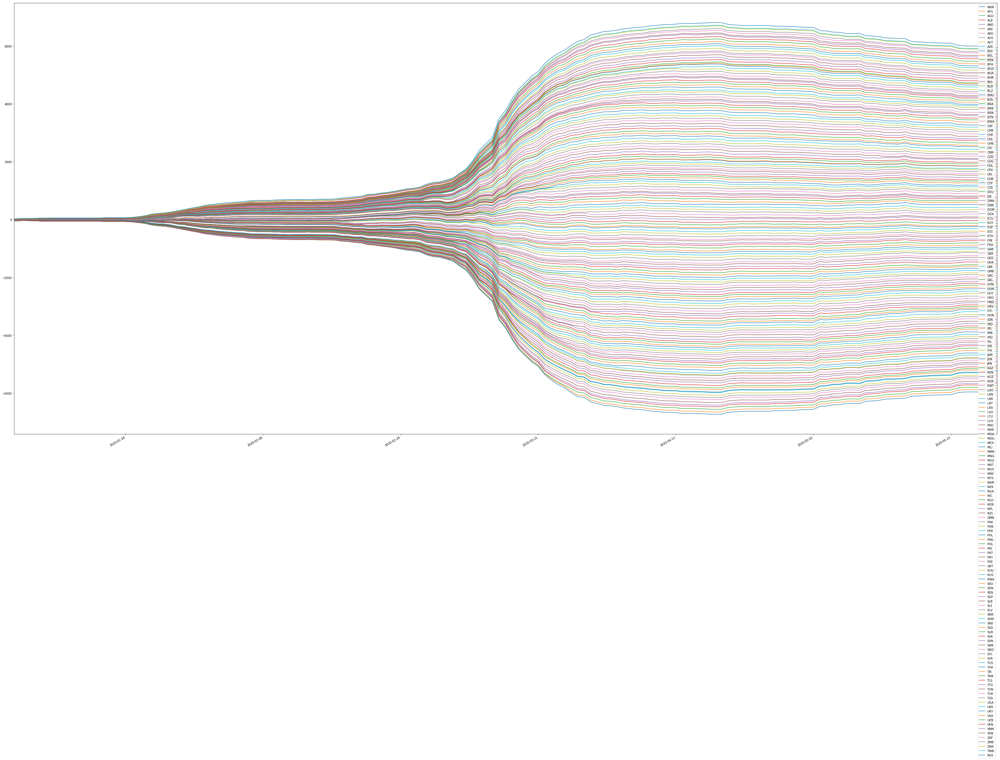

In [475]:
plt.figure()
df_rio_centrada.plot(figsize=(60,30))

plt.savefig('copa.png')